In [10]:
!pip install pymupdf

Defaulting to user installation because normal site-packages is not writeable


In [1]:
!pip install vaderSentiment

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 125 kB 14.5 MB/s eta 0:00:01


In [2]:
!pip install langdetect

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 981 kB 16.6 MB/s eta 0:00:01
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993221 sha256=281604f3e7eb2f0804c40198157c4c996d338869e1b376c5c9515744ae4cabd2
  Stored in directory: /home/tal012/.cache/pip/wheels/d1/c1/d9/7e068de779d863bc8f8fc9467d85e25cfe47fa5051fff1a1bb
Successfully built langdetect


In [4]:
!pip install nltk

Defaulting to user installation because normal site-packages is not writeable


In [5]:
!pip install --upgrade certifi

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 167 kB 15.7 MB/s eta 0:00:01


In [19]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 513 kB 12.0 MB/s eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Note: you may need to restart the kernel to use updated packages.


In [21]:
pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
from wordcloud import WordCloud

In [2]:
import ssl
import certifi
ssl._create_default_https_context = ssl.create_default_context
ssl._create_default_https_context().load_verify_locations(certifi.where())


In [3]:
import fitz  # PyMuPDF

def extract_text_from_pdf(pdf_path):
    # Open the PDF file
    pdf_document = fitz.open(pdf_path)
    text = ""
    
    # Iterate over each page
    for page_num in range(pdf_document.page_count):
        page = pdf_document.load_page(page_num)
        text += page.get_text()
    
    return text

In [4]:
#textbooks that can be directly extracted:
phili_7 = extract_text_from_pdf('phillipeans/Phili_7.pdf')
phili_8 = extract_text_from_pdf('phillipeans/phili_8.pdf')
phili_9 = extract_text_from_pdf('phillipeans/Phili_9.pdf')
india_7 = extract_text_from_pdf('india/India_7.pdf')
india_8 = extract_text_from_pdf('india/India_8.pdf')
india_9 = extract_text_from_pdf('india/India_9.pdf')
china_7 = extract_text_from_pdf('china/China_7.pdf')
china_8 = extract_text_from_pdf('china/china_8.pdf')
china_9 = extract_text_from_pdf('china/china_9.pdf')
turkey_9 = extract_text_from_pdf('turkey/Turkey_9.pdf')
tun_8 = extract_text_from_pdf('Tunisia/Tun_8.pdf')
tun_9 = extract_text_from_pdf('Tunisia/Tun_9.pdf')
saudi_7 = extract_text_from_pdf('saudi/Saudi_7.pdf')
saudi_8 = extract_text_from_pdf('saudi/Saudi_8.pdf')
saudi_9 = extract_text_from_pdf('saudi/Saudi_9.pdf')

In [5]:
textbooks = [phili_7, phili_8, phili_9, 
             india_7, india_8, india_9, 
             china_7, china_8, china_9, 
             turkey_9, 
             tun_8, tun_9, 
             saudi_7,saudi_8, saudi_9]

The previous are pasted from previous. From here, analyze the countries that have been colonized vs those have not been colonized

In [6]:
menWords = [" man ", " boy ", " male ", " brother ", " father ", " son ", " husband ", " king ", " prince ", " uncle ", " nephew ", " he ", " him ", " his ", " gentleman ", " sir ", " mr. ", " hero ", " lord ", " patriarch ", " man "]

womenWords = [" woman ", " girl ", " female ", " sister ", " mother ", " daughter ", " wife ", " queen ", " princess ", " aunt ", " niece ", " she ", " her ", " hers ", " lady ", " ma'am ", " mrs. ", " ms. ", " miss ", " heroine ", " dame ", " matriarch ", " woman "]


In [7]:
menPara = [[] for _ in range(14)]
womenPara = [[] for _ in range(14)]
for i in range(0, 14):
    paragraphs = textbooks[i].split('\n')  # Assuming paragraphs are separated by newlines
    for paragraph in paragraphs:
        for j in menWords:
            if j in paragraph.lower():  # Converts paragraph to lowercase for case-insensitive search
                menPara[i].append(paragraph)
        for j in womenWords:
            if j in paragraph.lower():  # Converts paragraph to lowercase for case-insensitive search
                womenPara[i].append(paragraph)

In [8]:
men_count = sum(len(sublist) for sublist in menPara)
print(men_count)
women_count = sum(len(sublist) for sublist in womenPara)
print(women_count)

4882
2669


sentiment analaysis

In [9]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [10]:
import warnings
warnings.filterwarnings('ignore')

#import natural language toolkit
import nltk



In [11]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to /home/tal012/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/tal012/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/tal012/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [12]:
from langdetect import detect

In [13]:
def clean_text(post):
    if detect(post) != 'en':
        return ''
    # Make posts lowercase
    post = post.lower()

    # Remove punctuation
    post = re.sub(r'[^a-zA-Z\s]', ' ', post)
    
    # Remove words with repeated letters
    #post = re.sub(r'([a-zA-Z])\1+', r'\1', post)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(post)
    filtered_text = [word for word in word_tokens if word not in stop_words]
    
    return ' '.join(filtered_text)

In [14]:
cleanMenParaList = []
for i in menPara:
        for j in i:
            cleanMenParaList.append(clean_text(j))
cleanWomenParaList = []
for i in womenPara:
    for j in i:
            cleanWomenParaList.append(clean_text(j))

In [15]:
cleanMenPara = ""
for i in menPara:
        for j in i:
            cleanMenPara += clean_text(j)
cleanWomenPara = ""
for i in womenPara:
    for j in i:
            cleanWomenPara+=clean_text(j)

In [16]:
analyzer = SentimentIntensityAnalyzer()

In [17]:
for i in cleanMenPara:
    sentiment = analyzer.polarity_scores(i)
    #print(f"Text: {i}")
    print(f"Sentiment: {sentiment}")
    print()

Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4588}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}

Sentime

In [18]:
sentiment = analyzer.polarity_scores(cleanMenPara)
print(f"Sentiment: {sentiment}")
print()

Sentiment: {'neg': 0.091, 'neu': 0.762, 'pos': 0.147, 'compound': 1.0}



In [19]:
sentiment = analyzer.polarity_scores(cleanWomenPara)
print(f"Sentiment: {sentiment}")
print()

Sentiment: {'neg': 0.089, 'neu': 0.759, 'pos': 0.151, 'compound': 1.0}



word cloud / tfidf

In [20]:
# Imports
%matplotlib inline

# Standard Python has some useful string tools
import string

# Collections is a part of standard Python, with some useful data objects
from collections import Counter

import numpy as np
import matplotlib.pyplot as plt

# Scikit-learn has some useful NLP tools, such as a TFIDF vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [21]:
tfidf = TfidfVectorizer(analyzer='word',
                        sublinear_tf=True,
                        max_features=5000,
                        tokenizer=nltk.word_tokenize)

In [22]:
tdidf = tfidf.fit(cleanMenParaList)

In [23]:
cleanMenParaList = [cleanMenParaList.strip() for cleanMenParaList in cleanMenParaList]
cleanWomenParaList = [cleanWomenParaList.strip() for cleanWomenParaList in cleanWomenParaList]

In [24]:
menTokens = []
for x in cleanMenParaList:
    menTokens.extend(nltk.word_tokenize(x))
womenTokens = []
for x in cleanWomenParaList:
    womenTokens.extend(nltk.word_tokenize(x))

In [25]:
menCounts = Counter(menTokens)
womenCounts = Counter(womenTokens)

In [26]:
menWordsNoSpace = ["man", "boy", "male", "brother", "father", "son", "husband", "king", "prince", "uncle", "nephew", "he", "him", "his", "gentleman", "sir", "mr", "hero", "lord", "patriarch", "man"]
womenWordsNoSpace = ["woman", "girl", "female", "sister", "mother", "daughter", "wife", "queen", "princess", "aunt", "niece", "she", "her", "hers", "lady", "ma'am", "mrs", "heroine", "dame", "matriarch", "woman"]
commonwords = [
    'see', 'think', 'first', 'knew', 'around', 'wanted', 'long', 'come', 'head', 'day', 
    'thought', 'house', 'never', 'still', 'voice', 'old', 'asked', 'new', 'always', 'say', 'b', 
    'also', 'room', 'away', 'made', 'work', 'hand', 'young', 'came', 'felt', 'willy', 'years', 
    'life', 'make', 'back', 'family', 'going', 'took', 'linda', 'want', 'heard', 
    'look', 'got', 'know', 'go', 'many', 'people', 'friends', 'take', 'time', 'right', 
    'way', 'like', 'let', 'looked', 'school', 'face', 'get', 'went', 'hair', 'could', 'tell', 
    'turned', 'leon', 'saw', 'give', 'teacher', 'eyes', 'told'
]


In [27]:
# Drop all stop words
for stop in nltk.corpus.stopwords.words('english'):
    if stop in menCounts:
        menCounts.pop(stop)
for i in menWordsNoSpace:
    if i in menCounts:
        menCounts.pop(i)
for stop in nltk.corpus.stopwords.words('english'):
    if stop in womenCounts:
        womenCounts.pop(stop)
for i in womenWordsNoSpace:
    if i in womenCounts:
        womenCounts.pop(i)
for i in commonwords:
    if i in womenCounts:
        womenCounts.pop(i)
    if i in menCounts:
        menCounts.pop(i)

In [28]:
menCounts.most_common(30)

[('said', 311),
 ('one', 184),
 ('would', 158),
 ('biff', 138),
 ('wife', 77),
 ('happy', 75),
 ('summers', 74),
 ('home', 71),
 ('mother', 71),
 ('arthur', 67),
 ('good', 61),
 ('well', 59),
 ('little', 57),
 ('help', 54),
 ('put', 51),
 ('two', 50),
 ('bedivere', 50),
 ('romeo', 49),
 ('woman', 45),
 ('god', 45),
 ('stop', 45),
 ('sword', 45),
 ('things', 44),
 ('find', 44),
 ('goes', 43),
 ('great', 42),
 ('friend', 42),
 ('money', 41),
 ('wise', 41),
 ('person', 39)]

In [29]:
womenCounts.most_common(30)

[('said', 144),
 ('one', 94),
 ('would', 79),
 ('father', 63),
 ('little', 54),
 ('daisy', 52),
 ('miss', 51),
 ('stevenson', 41),
 ('hoke', 41),
 ('home', 37),
 ('next', 36),
 ('help', 35),
 ('man', 34),
 ('mr', 33),
 ('left', 31),
 ('son', 31),
 ('night', 31),
 ('parents', 30),
 ('hands', 29),
 ('susan', 28),
 ('kitchen', 27),
 ('good', 26),
 ('boy', 26),
 ('brother', 25),
 ('husband', 24),
 ('frog', 24),
 ('gave', 23),
 ('children', 23),
 ('well', 22),
 ('capulet', 22)]

In [30]:
menTop10 = menCounts.most_common(10)
womenTop10 = womenCounts.most_common(10)

In [31]:
menTop10_words = [it[0] for it in menTop10]
menTop10_counts = [it[1] for it in menTop10]
womenTop10_words = [it[0] for it in womenTop10]
womenTop10_counts = [it[1] for it in womenTop10]

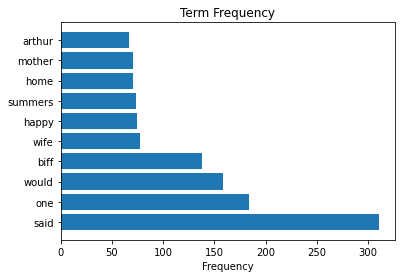

In [32]:
# Plot a barplot of the most frequent words in the text
plt.barh(menTop10_words, menTop10_counts)
plt.title('Term Frequency');
plt.xlabel('Frequency');

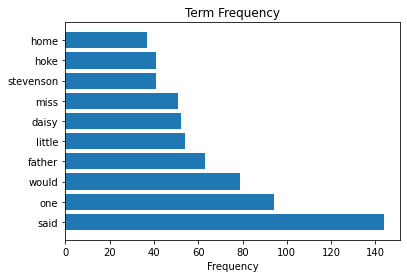

In [33]:
plt.barh(womenTop10_words, womenTop10_counts)
plt.title('Term Frequency');
plt.xlabel('Frequency');